# Imports


In [125]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import nltk  
nltk.download('stopwords')
from nltk.probability import FreqDist
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [126]:
df1 = pd.read_csv(r'C:\Users\lenovo\PycharmProjects\pythonProject2\Data\Hotel_Reviews_Trip_Advisor.csv')

In [127]:
df2 = pd.read_csv(r'C:\Users\lenovo\PycharmProjects\pythonProject2\Data\tripadvisor_hotel_reviews_structured.csv')

In [128]:
sns.set_context('poster')

#  Preprocessing

In [129]:
df1.head()

,Unnamed: 0,hotel_name,review_summary,score,review
0,0.0,Hotel Hilton London Gatwick Airport,Awful...,1.0,Its hard to find words that can describe this ...
1,1.0,Hilton London Metropole,Terrible,1.0,"Absolutely terrible. Cracked ceiling, tiny roo..."
2,2.0,Hilton London Euston,Double deposit taken from bank,1.0,Very disappointed firstly i checked in online ...
3,3.0,Hilton London Metropole,Super disappointed!,1.0,First of all we arrived wanting to park at the...
4,4.0,Hilton London Metropole,Dissatisfied Hilton gold number,1.0,"Hello, I currently staying @ Hilton Metropole..."


In [130]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9406 entries, 0 to 9405
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      9405 non-null   float64
 1   hotel_name      9406 non-null   object 
 2   review_summary  9406 non-null   object 
 3   score           9404 non-null   float64
 4   review          9404 non-null   object 
dtypes: float64(2), object(3)
memory usage: 367.5+ KB


In [131]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7105 entries, 0 to 7104
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Review  7105 non-null   object
 1   Rating  7105 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 111.1+ KB


In [132]:
df2.head()

,Review,Rating
0,horrible customer service hotel stay february ...,1
1,"noise airconditioner-a standard, arranged stay...",1
2,"bad choice, booked hotel hot wire called immed...",1
3,"hated inn terrible, room-service horrible staf...",1
4,ace grunge lives does mold mildew tiny bed met...,1


In [133]:
df2_new = df2.rename(columns={'Review': 'review', 'Rating': 'rating'} )
df1_new = df1.rename(columns={'score': 'rating'})

In [134]:
df1_new = df1_new.drop(['hotel_name', 'review_summary'], axis=1 )
df1_new

,Unnamed: 0,rating,review
0,0.0,1.0,Its hard to find words that can describe this ...
1,1.0,1.0,"Absolutely terrible. Cracked ceiling, tiny roo..."
2,2.0,1.0,Very disappointed firstly i checked in online ...
3,3.0,1.0,First of all we arrived wanting to park at the...
4,4.0,1.0,"Hello, I currently staying @ Hilton Metropole..."
...,...,...,...
9401,9400.0,5.0,Came to London with a pre booked trip and when...
9402,9401.0,5.0,It's been over a year since we stayed at the H...
9403,9402.0,5.0,My second stay here and what a transformation....
9404,9403.0,5.0,I arranged an annual business meeting at the H...


In [135]:
df1_new = df1_new.set_index('Unnamed: 0')
df1_new

,rating,review
Unnamed: 0,,
0.0,1.0,Its hard to find words that can describe this ...
1.0,1.0,"Absolutely terrible. Cracked ceiling, tiny roo..."
2.0,1.0,Very disappointed firstly i checked in online ...
3.0,1.0,First of all we arrived wanting to park at the...
4.0,1.0,"Hello, I currently staying @ Hilton Metropole..."
...,...,...
9400.0,5.0,Came to London with a pre booked trip and when...
9401.0,5.0,It's been over a year since we stayed at the H...
9402.0,5.0,My second stay here and what a transformation....


In [136]:
df2_new['rating'] = df2_new['rating'].astype(float)
df2_new

,review,rating
0,horrible customer service hotel stay february ...,1.0
1,"noise airconditioner-a standard, arranged stay...",1.0
2,"bad choice, booked hotel hot wire called immed...",1.0
3,"hated inn terrible, room-service horrible staf...",1.0
4,ace grunge lives does mold mildew tiny bed met...,1.0
...,...,...
7100,great hotel 12 females visited hotel hotel exc...,5.0
7101,"excellent hotel, hotel great bargain, staff fr...",5.0
7102,great hotel staff excellent rooms clean nicely...,5.0
7103,"hotel madrid hotel perfect, location tiny quie...",5.0


In [137]:
frames = [df1_new, df2_new]
df = pd.concat(frames)
display(df)

,rating,review
0.0,1.0,Its hard to find words that can describe this ...
1.0,1.0,"Absolutely terrible. Cracked ceiling, tiny roo..."
2.0,1.0,Very disappointed firstly i checked in online ...
3.0,1.0,First of all we arrived wanting to park at the...
4.0,1.0,"Hello, I currently staying @ Hilton Metropole..."
...,...,...
7100.0,5.0,great hotel 12 females visited hotel hotel exc...
7101.0,5.0,"excellent hotel, hotel great bargain, staff fr..."
7102.0,5.0,great hotel staff excellent rooms clean nicely...
7103.0,5.0,"hotel madrid hotel perfect, location tiny quie..."


In [138]:
df['rating'] = df['rating'].fillna((df['rating'].mean()))
df['rating'] = df['rating'].astype(int)

In [139]:
df['rating'].info()

<class 'pandas.core.series.Series'>
Float64Index: 16511 entries, 0.0 to 7104.0
Series name: rating
Non-Null Count  Dtype
--------------  -----
16511 non-null  int32
dtypes: int32(1)
memory usage: 193.5 KB


In [140]:
df['review'] = df['review'].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 16511 entries, 0.0 to 7104.0
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   rating  16511 non-null  int32 
 1   review  16511 non-null  object
dtypes: int32(1), object(1)
memory usage: 322.5+ KB


In [141]:
df.to_csv(r'C:\Users\lenovo\PycharmProjects\pythonProject2\Data\neural_network_data.csv',index=False)

<AxesSubplot:>

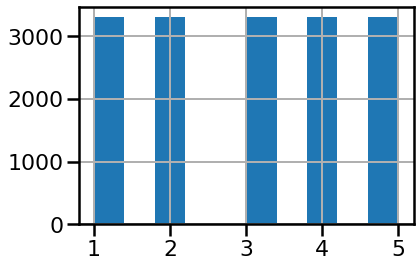

In [142]:
df['rating'].hist()

# 1.1 Checking Frequency of Words and Phrases in Review Summaries

In [143]:
df['review'] = df['review'].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 16511 entries, 0.0 to 7104.0
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   rating  16511 non-null  int32 
 1   review  16511 non-null  object
dtypes: int32(1), object(1)
memory usage: 322.5+ KB


In [144]:
flat_review_summary = " ".join(df['review'].values)

In [145]:
flat_review_summary

'Its hard to find words that can describe this experience without being too dismissive so i\'ll keep it short.  Pros. - Check experience was fine.... The checkin clerk was funny and helpful, and had a lovely manner with the guests. Very efficient. - Location... Very well set for access to Gatwick airport, with a short walk to the terminal for your flights.  Cons - Food...  the hotel not only was packed full and the restaurants were full, but the food itself was incredibly poor and expensive.   We did the buffet... on the evening.... barely anything was truly good tasting..... AVOID - Comfort... Hiltons of late seem to be less and less comfortable, the rooms stark... and without any character. Not the cleanest of rooms either. - its a big hotel.... everywhere is a lengthy walk and its just all a bit \'run down\'  Poor food, not the best night sleep, expensive for what it is, tired and in need of significant change.  AVOID! Absolutely terrible. Cracked ceiling, tiny room, bad quality tv,

In [146]:
flat_list_review_summaries = []
tokenizer = RegexpTokenizer(r'[a-zA-Z]+') 
tokenized_reviews = tokenizer.tokenize(flat_review_summary)

In [147]:
tokenized_reviews

['Its',
 'hard',
 'to',
 'find',
 'words',
 'that',
 'can',
 'describe',
 'this',
 'experience',
 'without',
 'being',
 'too',
 'dismissive',
 'so',
 'i',
 'll',
 'keep',
 'it',
 'short',
 'Pros',
 'Check',
 'experience',
 'was',
 'fine',
 'The',
 'checkin',
 'clerk',
 'was',
 'funny',
 'and',
 'helpful',
 'and',
 'had',
 'a',
 'lovely',
 'manner',
 'with',
 'the',
 'guests',
 'Very',
 'efficient',
 'Location',
 'Very',
 'well',
 'set',
 'for',
 'access',
 'to',
 'Gatwick',
 'airport',
 'with',
 'a',
 'short',
 'walk',
 'to',
 'the',
 'terminal',
 'for',
 'your',
 'flights',
 'Cons',
 'Food',
 'the',
 'hotel',
 'not',
 'only',
 'was',
 'packed',
 'full',
 'and',
 'the',
 'restaurants',
 'were',
 'full',
 'but',
 'the',
 'food',
 'itself',
 'was',
 'incredibly',
 'poor',
 'and',
 'expensive',
 'We',
 'did',
 'the',
 'buffet',
 'on',
 'the',
 'evening',
 'barely',
 'anything',
 'was',
 'truly',
 'good',
 'tasting',
 'AVOID',
 'Comfort',
 'Hiltons',
 'of',
 'late',
 'seem',
 'to',
 'be',


In [148]:
for review in tokenized_reviews:
    flat_list_review_summaries.append(review.lower())

In [149]:
flat_list_review_summaries

['its',
 'hard',
 'to',
 'find',
 'words',
 'that',
 'can',
 'describe',
 'this',
 'experience',
 'without',
 'being',
 'too',
 'dismissive',
 'so',
 'i',
 'll',
 'keep',
 'it',
 'short',
 'pros',
 'check',
 'experience',
 'was',
 'fine',
 'the',
 'checkin',
 'clerk',
 'was',
 'funny',
 'and',
 'helpful',
 'and',
 'had',
 'a',
 'lovely',
 'manner',
 'with',
 'the',
 'guests',
 'very',
 'efficient',
 'location',
 'very',
 'well',
 'set',
 'for',
 'access',
 'to',
 'gatwick',
 'airport',
 'with',
 'a',
 'short',
 'walk',
 'to',
 'the',
 'terminal',
 'for',
 'your',
 'flights',
 'cons',
 'food',
 'the',
 'hotel',
 'not',
 'only',
 'was',
 'packed',
 'full',
 'and',
 'the',
 'restaurants',
 'were',
 'full',
 'but',
 'the',
 'food',
 'itself',
 'was',
 'incredibly',
 'poor',
 'and',
 'expensive',
 'we',
 'did',
 'the',
 'buffet',
 'on',
 'the',
 'evening',
 'barely',
 'anything',
 'was',
 'truly',
 'good',
 'tasting',
 'avoid',
 'comfort',
 'hiltons',
 'of',
 'late',
 'seem',
 'to',
 'be',


In [150]:
stop_words = stopwords.words("english")

flat_list_review_summaries_no_stop = [word for word in flat_list_review_summaries if word not in stop_words]

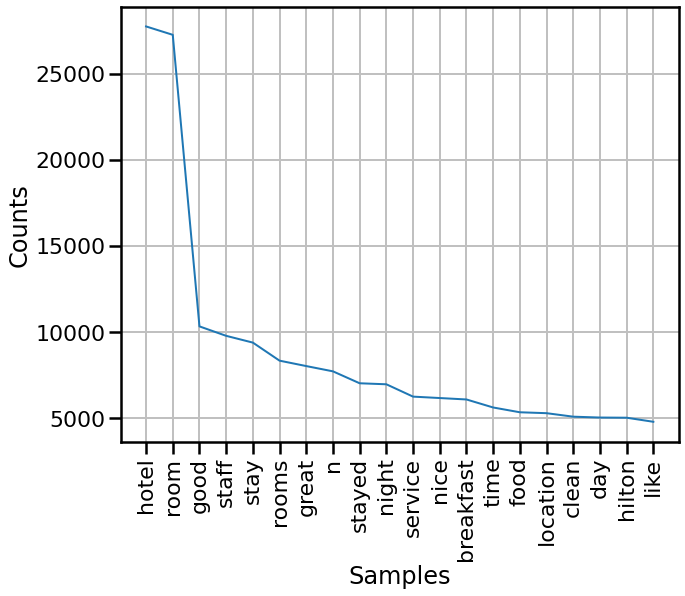

In [151]:
plt.figure(figsize=(10,8))
plt.xticks(rotation=45)
FreqDist(flat_list_review_summaries_no_stop).plot(20)
plt.show()

In [152]:
flat_sum_str = " ".join(flat_list_review_summaries_no_stop)

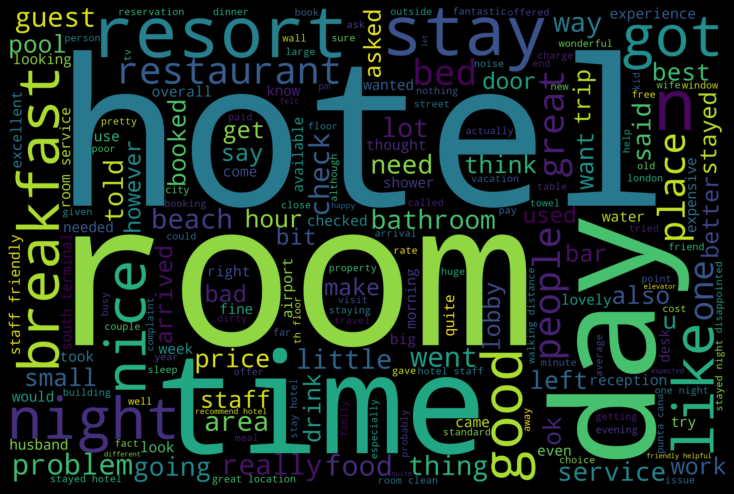

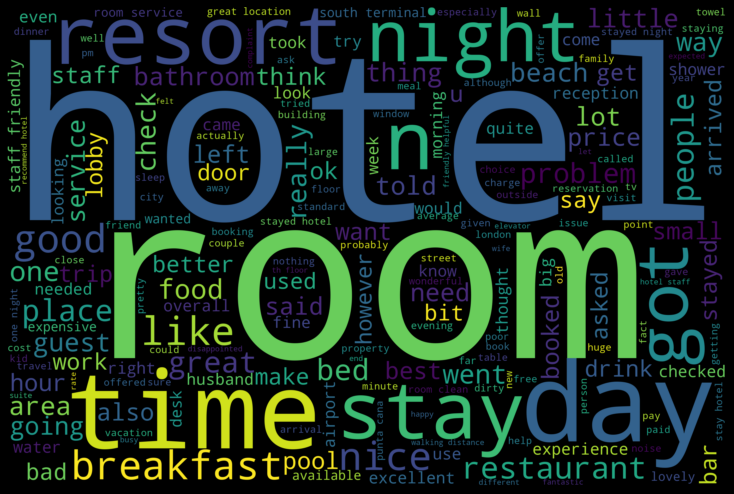

In [153]:
wordcloud = WordCloud(width = 3000,
                      height = 2000,
                      background_color = 'black',
                      stopwords = stop_words)

wordcloud.generate(flat_sum_str)

plt.figure(figsize = (10,10),
           facecolor = 'k',
           edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# 1.2 Removing Unmeaningful Words 1st Attempt

In [154]:
for word in ['hotel','room','staff','stay','location','rooms','service','room','n','time','food','day','beach']:
    stop_words.append(word)

In [155]:
flat_list_review_summaries_no_stop_2 =  [word for word in flat_list_review_summaries_no_stop if word not in stop_words]

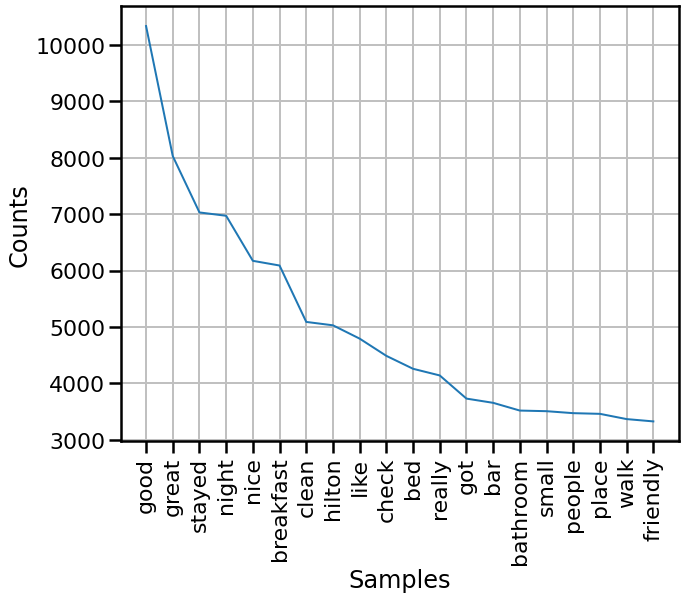

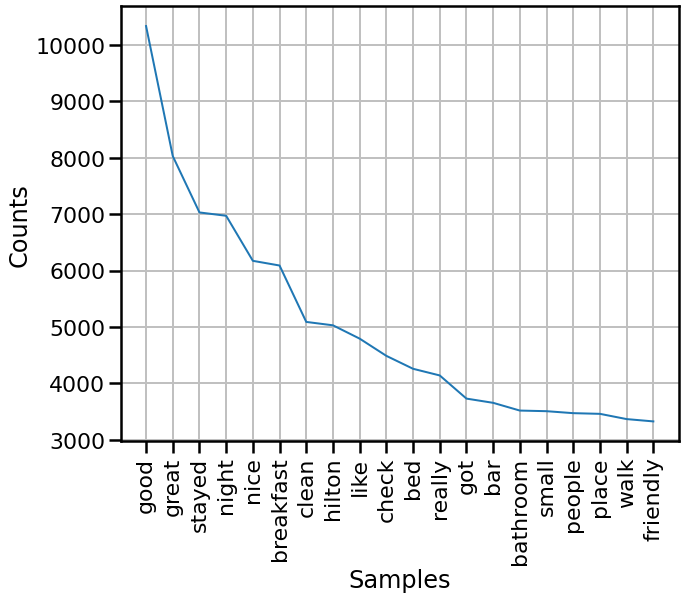

In [156]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_2).plot(20)
plt.show()

# 1.3 Removing Unmeaningful Words 2nd Attempt

In [157]:
for word in ['night','breakfast','really','place','resort','pool','walk','people','bar','got','bed']:
    stop_words.append(word)

In [158]:
flat_list_review_summaries_no_stop_3 =  [word for word in flat_list_review_summaries_no_stop_2 if word not in stop_words]

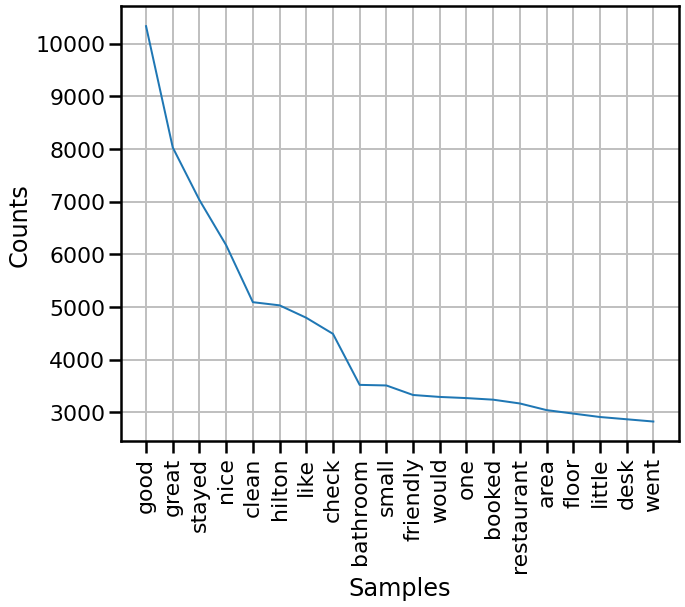

In [159]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_3).plot(20)
plt.show()

# 1.4 Removing Unmeaningful Words 3nd Attempt

In [160]:
for word in ['area','check','restaurant','bathroom','best','floor','water','went']:
    stop_words.append(word)

In [161]:
flat_list_review_summaries_no_stop_4 =  [word for word in flat_list_review_summaries_no_stop_3 if word not in stop_words]

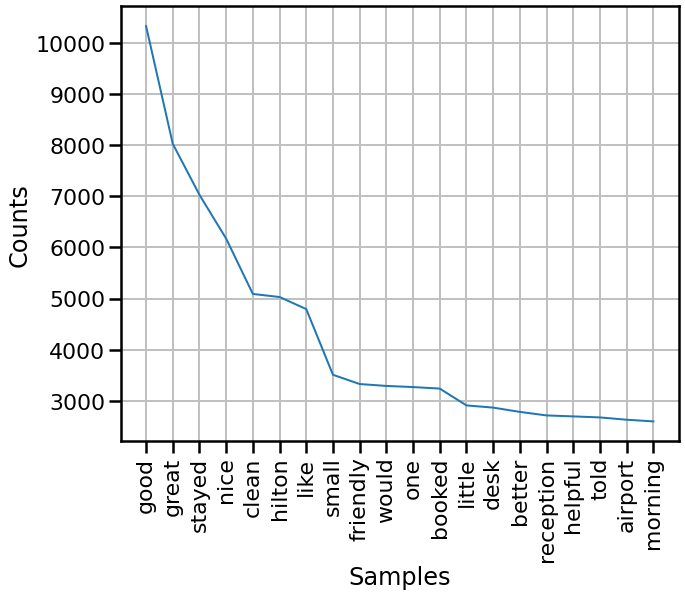

In [162]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_4).plot(20)
plt.show()

# 1.5 Removing Unmeaningful Words 4nd Attempt

In [163]:
for word in ['restaurants','booked','recommend','hilton','trip','desk','nights','night','view']:
    stop_words.append(word)

In [164]:
flat_list_review_summaries_no_stop_5 =  [word for word in flat_list_review_summaries_no_stop_4 if word not in stop_words]

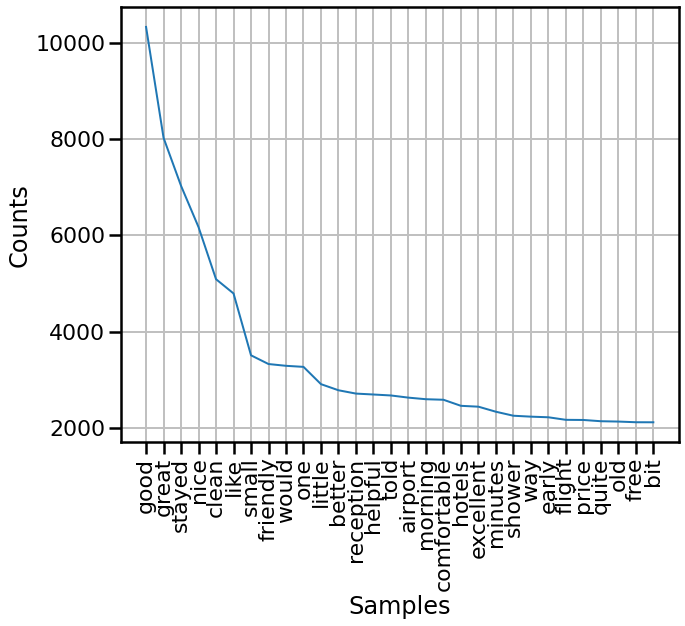

In [165]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_5).plot(30)
plt.show()

# 1.6 Removing Unmeaningful Words 5nd Attempt

In [166]:
for word in ['hotels','free','way','away','bit','airport','minutes','price','make','morning','city','buffet']:
    stop_words.append(word)

In [167]:
flat_list_review_summaries_no_stop_6 =  [word for word in flat_list_review_summaries_no_stop_5 if word not in stop_words]

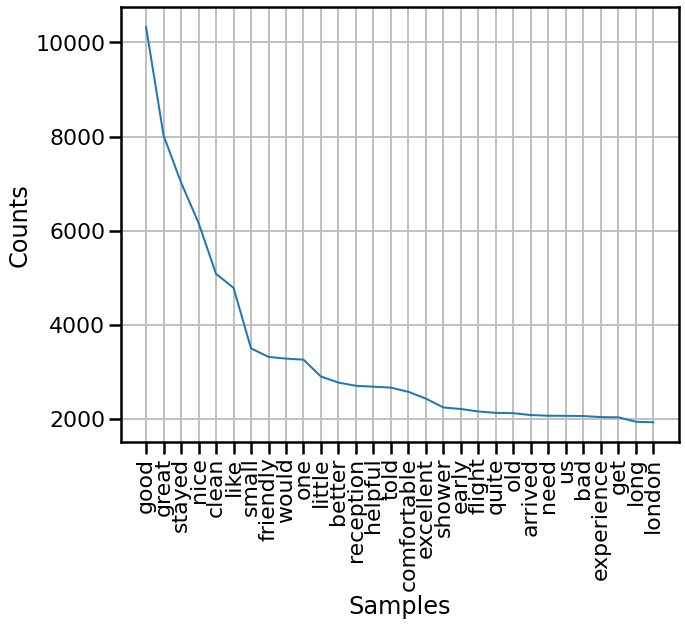

In [168]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_6).plot(30)
plt.show()

# 1.7 Removing Unmeaningful Words 6nd Attempt

In [169]:
for word in ['say','experience','lobby','shower','street','reviews','reception','days','close','need']:
    stop_words.append(word)

In [170]:
flat_list_review_summaries_no_stop_7 =  [word for word in flat_list_review_summaries_no_stop_6 if word not in stop_words]

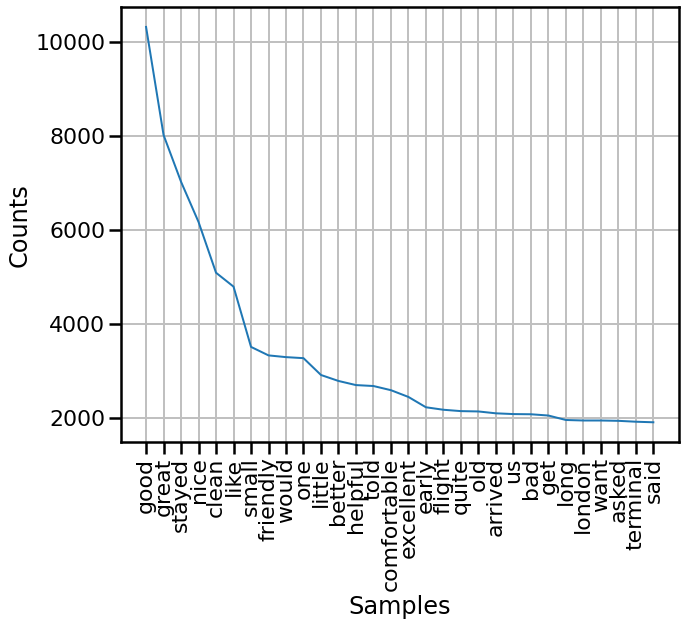

In [171]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_7).plot(30)
plt.show()

# 1.8 Removing Unmeaningful Words 7nd Attempt

In [172]:
for word in ['going','arrived','definitely','told','beds','bed','th']:
    stop_words.append(word)

In [173]:
flat_list_review_summaries_no_stop_8 =  [word for word in flat_list_review_summaries_no_stop_7 if word not in stop_words]

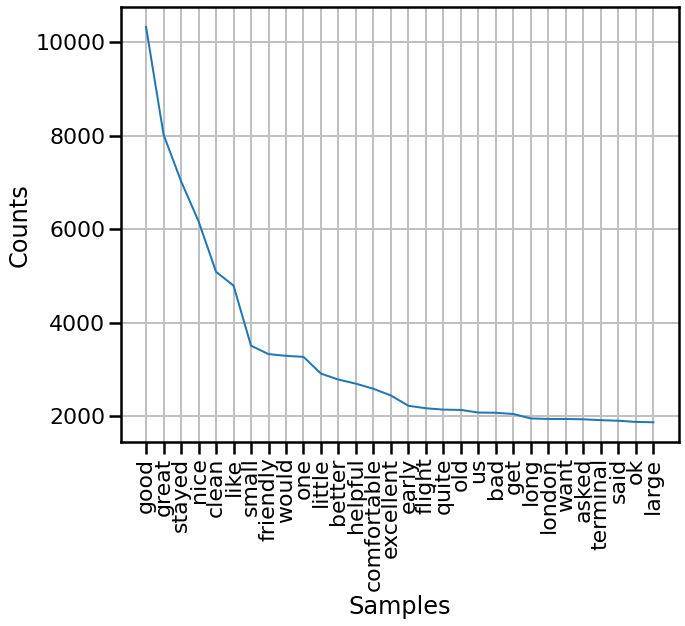

In [174]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_8).plot(30)
plt.show()

# 1.9 Removing Unmeaningful Words 8nd Attempt

In [175]:
for word in ['took','use','one','station','times','think']:
    stop_words.append(word)

In [176]:
flat_list_review_summaries_no_stop_9 =  [word for word in flat_list_review_summaries_no_stop_8 if word not in stop_words]

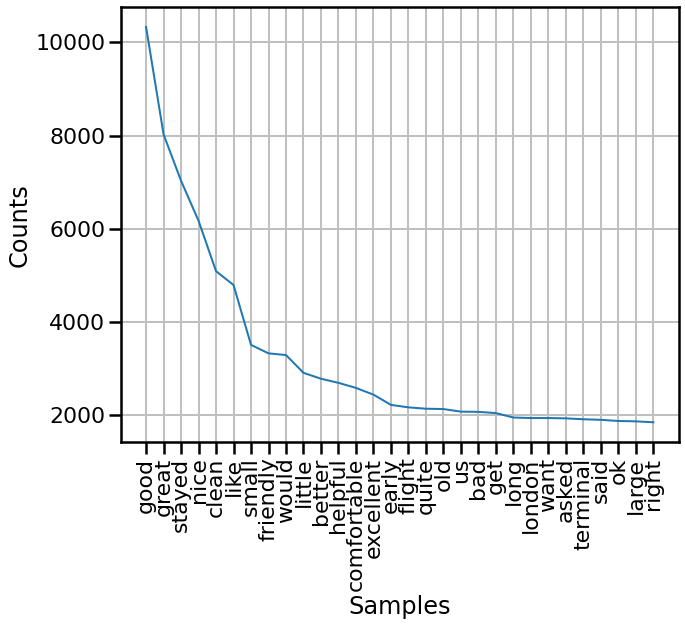

In [177]:
plt.figure(figsize=(10,8))
FreqDist(flat_list_review_summaries_no_stop_9).plot(30)
plt.show()

# Word Cloud for Review Summaries

In [178]:
flat_clean_sum_str = " ".join(flat_list_review_summaries_no_stop_9)

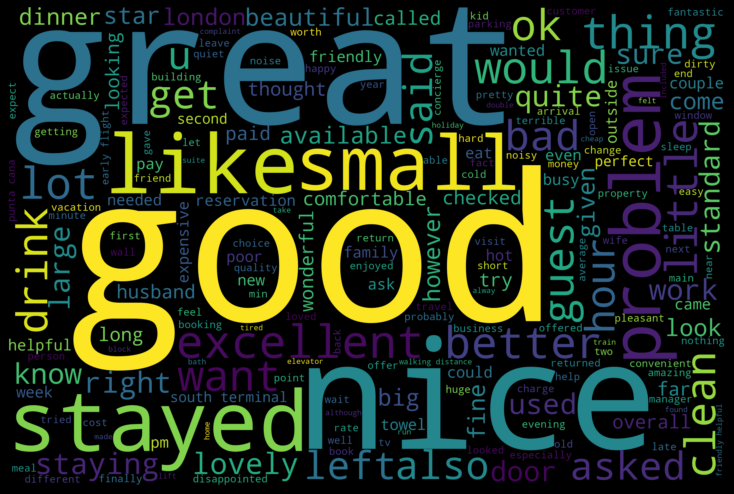

In [179]:
wordcloud = WordCloud(width = 3000,
                      height = 2000,
                      background_color = 'black',
                      stopwords = stop_words)

wordcloud.generate(flat_clean_sum_str)

plt.figure(figsize = (10,10),
           facecolor = 'k',
           edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off') 
plt.tight_layout(pad=0)
plt.show()

# Stemming and Lemming

In [180]:
stemmer = PorterStemmer()
lemmy = WordNetLemmatizer()

In [181]:
def apply_stem(doc):
    
    doc_split = doc.split(' ')
    stem_doc = ''
    for word in doc_split:
        stem_doc += stemmer.stem(word) + ' '
        
    return stem_doc



def apply_lem(doc):
    
    doc_split = doc.split(' ')
    lem_v_doc = ''
    for word in doc_split:
        lem_v_doc += lemmy.lemmatize(word, pos='v') + ' '
        
    doc_split = lem_v_doc.split(' ')
    lem_doc = ''
    for word in doc_split:
        lem_doc += lemmy.lemmatize(word, pos='a') + ' '
        
    return lem_doc

In [182]:
df.head()

,rating,review
0.0,1,Its hard to find words that can describe this ...
1.0,1,"Absolutely terrible. Cracked ceiling, tiny roo..."
2.0,1,Very disappointed firstly i checked in online ...
3.0,1,First of all we arrived wanting to park at the...
4.0,1,"Hello, I currently staying @ Hilton Metropole..."


In [183]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [184]:
df['review_stemmed'] = df['review'].apply(apply_stem)
df['review_lemmed'] = df['review'].apply(apply_lem)

In [185]:
df.head()

,rating,review,review_stemmed,review_lemmed
0.0,1,Its hard to find words that can describe this ...,it hard to find word that can describ thi expe...,Its hard to find word that can describe this e...
1.0,1,"Absolutely terrible. Cracked ceiling, tiny roo...","absolut terrible. crack ceiling, tini room, ba...","Absolutely terrible. Cracked ceiling, tiny roo..."
2.0,1,Very disappointed firstly i checked in online ...,veri disappoint firstli i check in onlin but h...,Very disappoint firstly i check in online but ...
3.0,1,First of all we arrived wanting to park at the...,first of all we arriv want to park at the hote...,First of all we arrive want to park at the hot...
4.0,1,"Hello, I currently staying @ Hilton Metropole...","hello, i current stay @ hilton metropol in lo...","Hello, I currently stay @ Hilton Metropole in..."


In [186]:
review_index_to_check = 3000
print("ORIGINAL REVIEW:",'\n',df['review'].iloc[review_index_to_check],'\n')
print("STEMMED REIVEW:",'\n',df['review_stemmed'].iloc[review_index_to_check],'\n')
print("LEMMED REVIEW:",'\n',df['review_lemmed'].iloc[review_index_to_check],'\n')

ORIGINAL REVIEW: 
 I have finally decided not to stay at the London Hilton Metropole ever again. I have been staying there for many years now because of its central location - walking distance to Oxford, Regent Streets. However over the past year the check-in service has become surprisingly bizarre. I don't think this has anything to do with the on-going renovations. I am an HiltonHonors card holder - GOLD who consistently books a KING deluxe or executive room. On THREE occasions, upon check-in, I was told "We are completely booked but we are pleased to upgrade you to a much better room" only to open the door and walk into a box with 2 SINGLE beds. Once is an error but THREE times appears to be a strategy. How does a King upgrade to a single bed!!!! On each occasion, after complaining I was moved… 

STEMMED REIVEW: 
 i have final decid not to stay at the london hilton metropol ever again. i have been stay there for mani year now becaus of it central locat - walk distanc to oxford, rege

Stemmation had broken down some words into words that don't exist, whereas lemmitisation had simplified adjectives and verbs to their root form. I chose to continue with the lemmitised version of the texts for further processing.

# Train - Test Split

In [187]:
df.head()

,rating,review,review_stemmed,review_lemmed
0.0,1,Its hard to find words that can describe this ...,it hard to find word that can describ thi expe...,Its hard to find word that can describe this e...
1.0,1,"Absolutely terrible. Cracked ceiling, tiny roo...","absolut terrible. crack ceiling, tini room, ba...","Absolutely terrible. Cracked ceiling, tiny roo..."
2.0,1,Very disappointed firstly i checked in online ...,veri disappoint firstli i check in onlin but h...,Very disappoint firstly i check in online but ...
3.0,1,First of all we arrived wanting to park at the...,first of all we arriv want to park at the hote...,First of all we arrive want to park at the hot...
4.0,1,"Hello, I currently staying @ Hilton Metropole...","hello, i current stay @ hilton metropol in lo...","Hello, I currently stay @ Hilton Metropole in..."


In [188]:
x_train, x_test, y_train, y_test = train_test_split(df.drop(columns=['rating']), 
                                                    df['rating'], 
                                                    test_size=.2, 
                                                    random_state=42)

In [189]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(13208, 3)
(3303, 3)
(13208,)
(3303,)


In [190]:
x_train.head()

,review,review_stemmed,review_lemmed
3699.0,honeymoon dominican looking reasonably priced ...,honeymoon dominican look reason price vacat n'...,honeymoon dominican look reasonably price vaca...
5713.0,"I was lucky to be upgraded on check -in , bein...","i wa lucki to be upgrad on check -in , be a hh...","I be lucky to be upgrade on check -in , be a H..."
6979.0,home away home staying hotel trip paris 1981 p...,home away home stay hotel trip pari 1981 prior...,home away home stay hotel trip paris 1981 prio...
5027.0,This Hilton hotel has a good location in the h...,thi hilton hotel ha a good locat in the heart ...,This Hilton hotel have a good location in the ...
7131.0,"A great place to stay if visiting Maida Vale, ...","a great place to stay if visit maida vale, st ...","A great place to stay if visit Maida Vale, St ..."


In [191]:
x_test.head()

,review,review_stemmed,review_lemmed
5375.0,I booked my hotel room thinking I would'nt be ...,i book my hotel room think i would'nt be bring...,I book my hotel room think I would'nt be bring...
5120.0,"classy central hotel our-post stay med cruise,...","classi central hotel our-post stay med cruise,...","classy central hotel our-post stay med cruise,..."
3401.0,"Ok, so arrived tired from work.. First room st...","ok, so arriv tire from work.. first room stank...","Ok, so arrive tire from work.. First room stin..."
3937.0,piccolo hotel small friendly friend recommende...,piccolo hotel small friendli friend recommend ...,piccolo hotel small friendly friend recommend ...
3843.0,Had early departure so decided to book this ho...,"had earli departur so decid to book thi hotel,...",Had early departure so decide to book this hot...


In [192]:
y_test.head()

5375.0    3
5120.0    4
3401.0    2
3937.0    3
3843.0    3
Name: rating, dtype: int32

In [193]:
y_train.head()

3699.0    3
5713.0    4
6979.0    5
5027.0    3
7131.0    4
Name: rating, dtype: int32

In [194]:
y_train_df = pd.DataFrame(y_train).reset_index(drop=True)
y_test_df = pd.DataFrame(y_test).reset_index(drop=True)
y_train_df.head()

,rating
0,3
1,4
2,5
3,3
4,4


# TF-IDF Vectorisation for Reviews

In [195]:
tokenizer = RegexpTokenizer(r'[a-zA-Z]+')

tf_idf_vect = TfidfVectorizer(lowercase=True,
                              tokenizer = tokenizer.tokenize, 
                              stop_words=stop_words, 
                              ngram_range=(1,2),
                              min_df = 0.05)
 
x_lemm_train_tfidf_sparse = tf_idf_vect.fit_transform(x_train['review_lemmed'])

x_lemm_test_tfidf_sparse = tf_idf_vect.transform(x_test['review_lemmed'])


x_lemm_train_tfidf = pd.DataFrame(x_lemm_train_tfidf_sparse.toarray(), 
                                  columns=tf_idf_vect.get_feature_names())

x_lemm_test_tfidf = pd.DataFrame(x_lemm_test_tfidf_sparse.toarray(), 
                                  columns=tf_idf_vect.get_feature_names())


x_lemm_train_tfidf.head()

C:\Users\lenovo\anaconda3\envs\SentimentCapstone\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\lenovo\anaconda3\envs\SentimentCapstone\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,access,air,also,arrival,arrive,ask,available,back,bad,beautiful,...,visit,wait,wall,want,week,well,wonderful,work,worth,would
0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.134098,0.00000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
1,0.000000,0.0,0.275745,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,...,0.000000,0.259551,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
2,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.34683,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
3,0.274791,0.0,0.254736,0.0,0.0,0.0,0.266363,0.0,0.000000,0.00000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.203478
4,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,...,0.326772,0.000000,0.0,0.0,0.0,0.0,0.0,0.275654,0.0,0.000000


# Saving Preprocessed Dataset as CSVs

In [196]:
x_lemm_train_tfidf.to_csv(r'C:\Users\lenovo\PycharmProjects\pythonProject2\Data\Trainn-Test\x_train_data.csv',index=False)

In [197]:
x_lemm_test_tfidf.to_csv(r'C:\Users\lenovo\PycharmProjects\pythonProject2\Data\Trainn-Test\x_test_data.csv',index=False)

In [198]:
y_train_df.to_csv(r'C:\Users\lenovo\PycharmProjects\pythonProject2\Data\Trainn-Test\y_train_data.csv',index=False)

In [199]:
y_test_df.to_csv(r'C:\Users\lenovo\PycharmProjects\pythonProject2\Data\Trainn-Test\y_test_data.csv',index=False)